# Amazon Bin Image Dataset
 * To complete this project we will be using the [Amazon Bin Image Dataset](https://registry.opendata.aws/amazon-bin-imagery/) The dataset contains 500,000 images of bins containing one or more objects. For each image there is a metadata file containing information about the image like the number of objects, it's dimension and the type of object. For this task, we will try to classify the number of objects in each bin. 

# Table of contents:
<ul>
<li><a href="#preparation">Data Preparation</a></li>
    <li><a href="#distribution"> Data distribution after balancing classes</a></li>
<li><a href="#s3">Uploading the data to S3 Bucket</a></li>
<li><a href="#exploration">Data Exploration</a></li>
<li><a href="#training">Model Training</a></li>
<li><a href="#tuning">Hyperparameter Tuning</a></li>
<li><a href="#best hyperparameters">Train the model with best hyperparameters</a></li>   
<li><a href="#deploying">Model Deploying and Querying</a></li>   
<li><a href="#inferenc">Inference for each class</a></li>            
</ul>

In [ ]:
# TODO: Install any packages that you might need

In [ ]:
# TODO: Import any packages that you might need

<a id='preparation'></a>
## Data Preparation
**TODO:** Run the cell below to download the data.

The cell below creates a folder called `train_data`, downloads training data and arranges it in subfolders. Each of these subfolders contain images where the number of objects is equal to the name of the folder. For instance, all images in folder `1` has images with 1 object in them. Images are not divided into training, testing or validation sets. If you feel like the number of samples are not enough, you can always download more data (instructions for that can be found [here](https://registry.opendata.aws/amazon-bin-imagery/)). However, we are not acessing you on the accuracy of your final trained model, but how you create your machine learning engineering pipeline.

* To finish this step I made another notebook: (getting_and_splitting_data.ipynb)

In [1]:
import os
import json
import boto3
from tqdm import tqdm
import numpy as np
s3_client = boto3.client('s3')
import shutil

In [1]:

def download_and_arrange_data():
    s3_client = boto3.client('s3')

    with open('file_list.json', 'r') as f:
        d=json.load(f)

    for k, v in d.items():
        print(f"Downloading Images with {k} objects")
        directory=os.path.join('train_data', k)
        if not os.path.exists(directory):
            os.makedirs(directory)
        for file_path in tqdm(v):
            file_name=os.path.basename(file_path).split('.')[0]+'.jpg'
            s3_client.download_file('aft-vbi-pds', os.path.join('bin-images', file_name),
                             os.path.join(directory, file_name))

# download_and_arrange_data()

In [2]:
download_and_arrange_data()

100%|██████████| 1228/1228 [01:46<00:00, 11.48it/s]


100%|██████████| 2299/2299 [03:27<00:00, 11.10it/s]


100%|██████████| 2666/2666 [03:58<00:00, 11.16it/s]


100%|██████████| 2373/2373 [03:31<00:00, 11.24it/s]


100%|██████████| 1875/1875 [02:43<00:00, 11.45it/s]


## Dataset
**TODO:** Explain what dataset you are using for this project. Give a small overview of the classes, class distributions etc that can help anyone not familiar with the dataset get a better understanding of it. You can find more information about the data [here](https://registry.opendata.aws/amazon-bin-imagery/).

In [4]:
#TODO: Perform any data cleaning or data preprocessing

with open('file_list.json', 'r') as f:
    
     d=json.load(f)

In [4]:
for c in d.keys():
    print(f"Number of images in class {c} is: {len(d[c])} ")

Number of images in class 1 is: 1228 
Number of images in class 2 is: 2299 
Number of images in class 3 is: 2666 
Number of images in class 4 is: 2373 
Number of images in class 5 is: 1875 


In [17]:
count_of_classes=[len(d[c]) for c in d.keys()]
classes=[f"Class_of_images_contain: {k} object/s" for k in d.keys()]


In [17]:
import seaborn as sb
import numpy as np
import matplotlib.pyplot as plt
def plot_col_value_counts(x,y,xlabel_name="",ylabel_name="",title=""):
    sb.set(font_scale=2)
    sb.set(style="whitegrid")
    plt.figure(figsize=(12,8))
    ax=sb.barplot(
        x=x,y=y,color="blue")
    plt.title(title)
    plt.xlabel(xlabel_name)
    plt.ylabel(ylabel_name)
    plt.xticks(rotation=65)
    for p in ax.patches:
        
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
                    
                    
   
    plt.show()

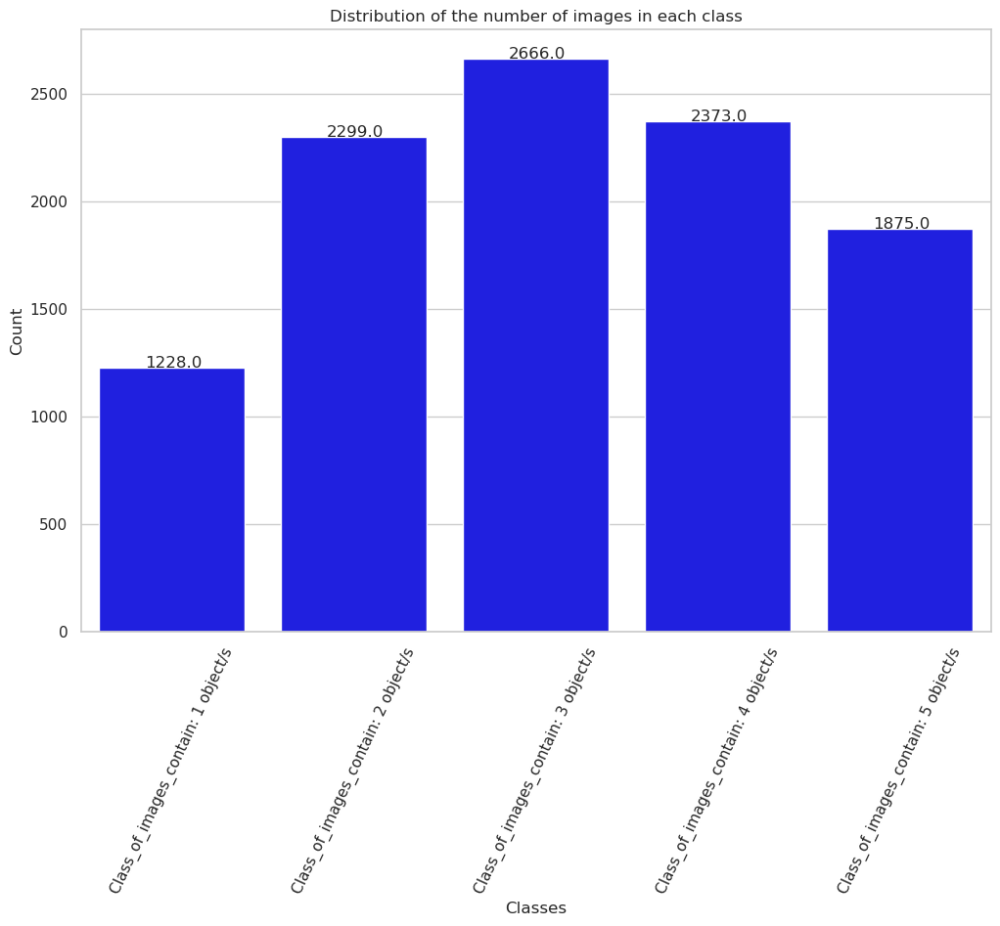

In [18]:
plot_col_value_counts(classes,count_of_classes,"Classes","Count","Distribution of the number of images in each class")

<a id='distribution'></a>
### Data distribution after balancing classes

In [45]:
def count_classes(path):
    d={}
    for subdir, dirs, files in os.walk(path):
        for dr in dirs:
            if dr !=".ipynb_checkpoints":



                lst = os.listdir(os.path.join(subdir, dr))
                d[dr]=len(lst)
    return d
    

In [46]:
train_dic=count_classes("data/train")
train_dic

{'1': 2000, '2': 2000, '4': 2000, '5': 2000, '3': 2000}

In [47]:
test_dic=count_classes("data/test")
test_dic

{'1': 319, '2': 319, '4': 319, '5': 319, '3': 319}

In [48]:
valid_dic=count_classes("data/valid")
valid_dic

{'1': 319, '2': 319, '4': 319, '5': 319, '3': 319}

In [51]:
import seaborn as sb
import numpy as np
import matplotlib.pyplot as plt
def plot_col_value_counts(x,y,xlabel_name="",ylabel_name="",title=""):
    sb.set(font_scale=2)
    sb.set(style="whitegrid")
    plt.figure(figsize=(10,6))
    ax=sb.barplot(
        x=x,y=y,color="blue")
    plt.title(title)
    plt.xlabel(xlabel_name)
    plt.ylabel(ylabel_name)
#     plt.xticks(rotation=65)
    for p in ax.patches:
        
        ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
                    
                    
   
    plt.show()

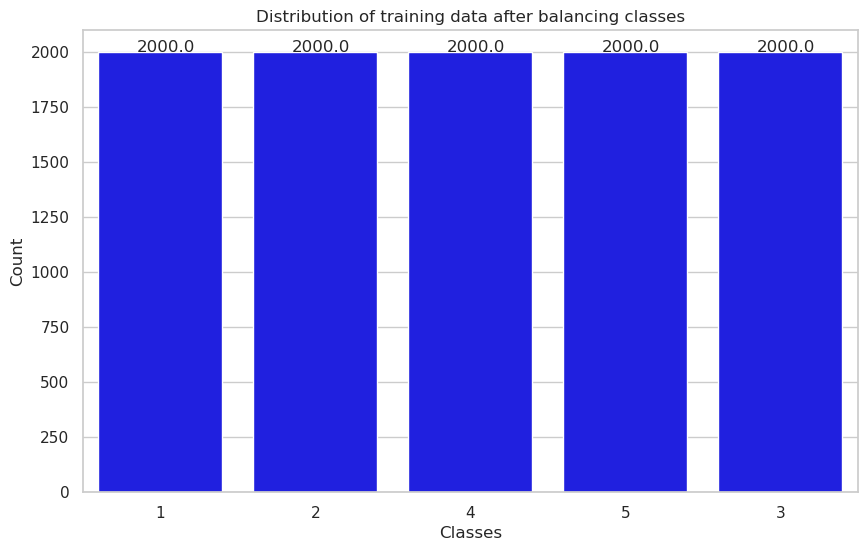

In [52]:
plot_col_value_counts(
    list(train_dic.keys()),list(train_dic.values()),"Classes","Count","Distribution of training data after balancing classes")

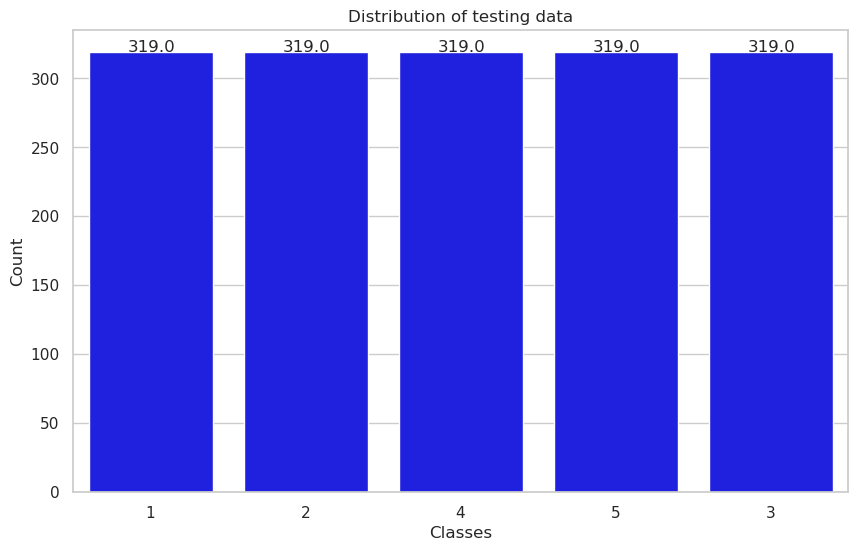

In [53]:
plot_col_value_counts(
    list(test_dic.keys()),list(test_dic.values()),"Classes","Count","Distribution of testing data")

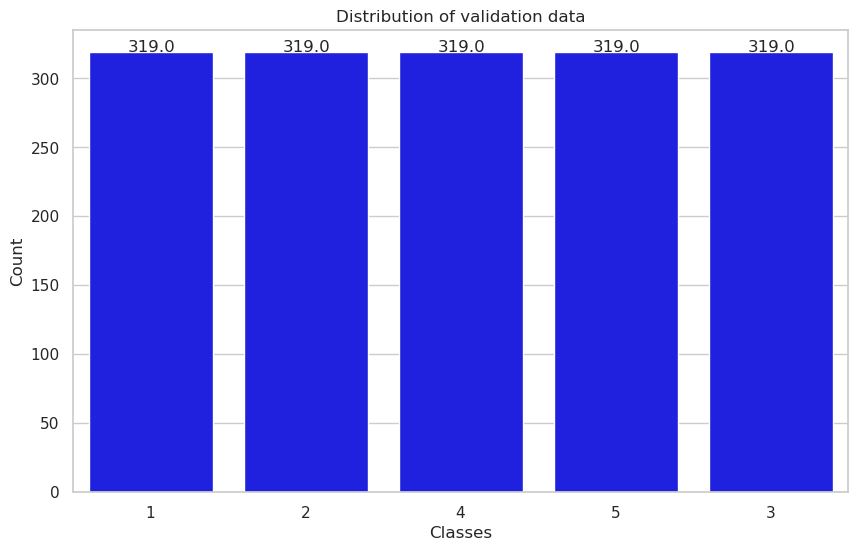

In [54]:
plot_col_value_counts(
    list(valid_dic.keys()),list(valid_dic.values()),"Classes","Count","Distribution of validation data")

<a id='s3'><a/>

# Uploading the data to S3 Bucket

In [132]:
%%capture
!aws s3 cp data s3://capstone-project-amazon-bin-images/data/ --recursive

In [135]:
print(f"Data Path: s3://capstone-project-amazon-bin-images/data/")


Data Path: s3://capstone-project-amazon-bin-images/data/


<a id='exploration'><a/>
    
# Data Exploration

In [154]:
import matplotlib.pyplot as plt
import random
from PIL import Image
import glob
def plot_images(class_path):
    plt.figure(1, figsize=(15, 9))
    plt.rc('figure', autolayout=True)
    plt.rc('axes', labelweight='bold', labelsize='large',
          titleweight='bold', titlesize=18, titlepad=10)
    plt.rc('image', cmap='magma')
    n = 0
    for i in range(16):
        n += 1
        random_img = random.choice(class_path)
        plt.subplot(4, 4, n)
        plt.axis('off')
        random_img=Image.open(random_img)
        plt.imshow(random_img,cmap='gray');

### * Random Images from class 1: Image contains one object

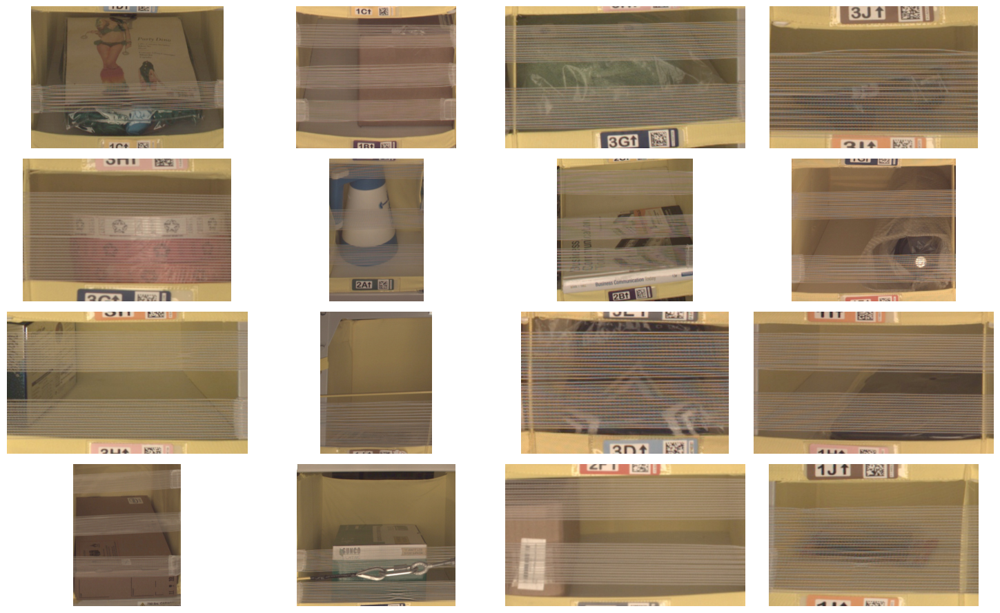

In [159]:
plot_images(glob.glob('data/train/1/*.jpg'))

### * Random Images from class 2: Image contains 2 object

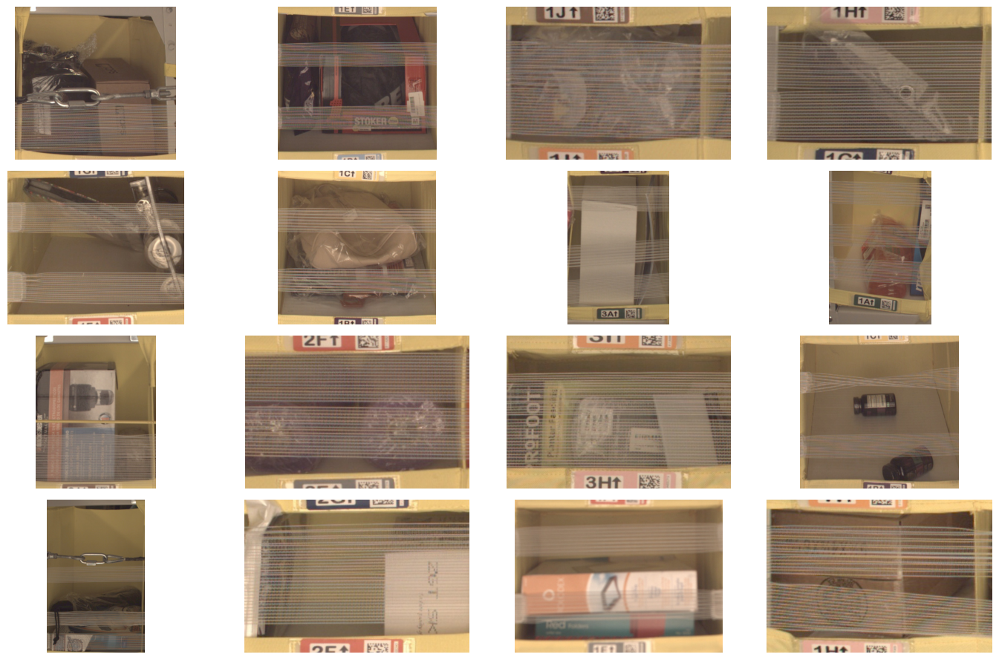

In [160]:
plot_images(glob.glob('data/train/2/*.jpg'))

### * Random Images from class 3: Image contains 3 object

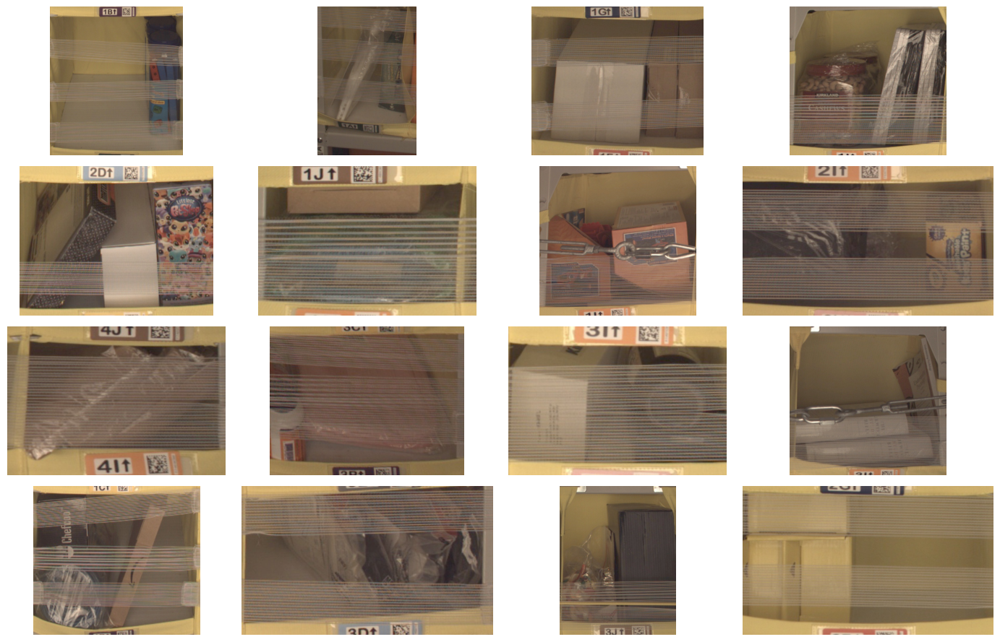

In [161]:
plot_images(glob.glob('data/train/3/*.jpg'))

### * Random Images from class 4: Image contains 4 object

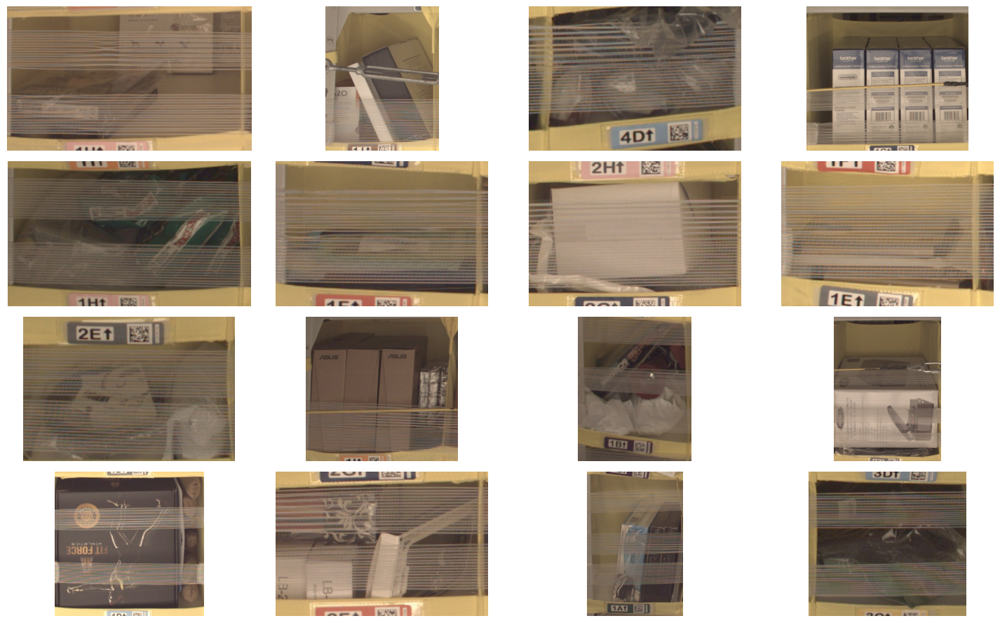

In [162]:
plot_images(glob.glob('data/train/4/*.jpg'))

### * Random Images from class5: Image contains 5 object

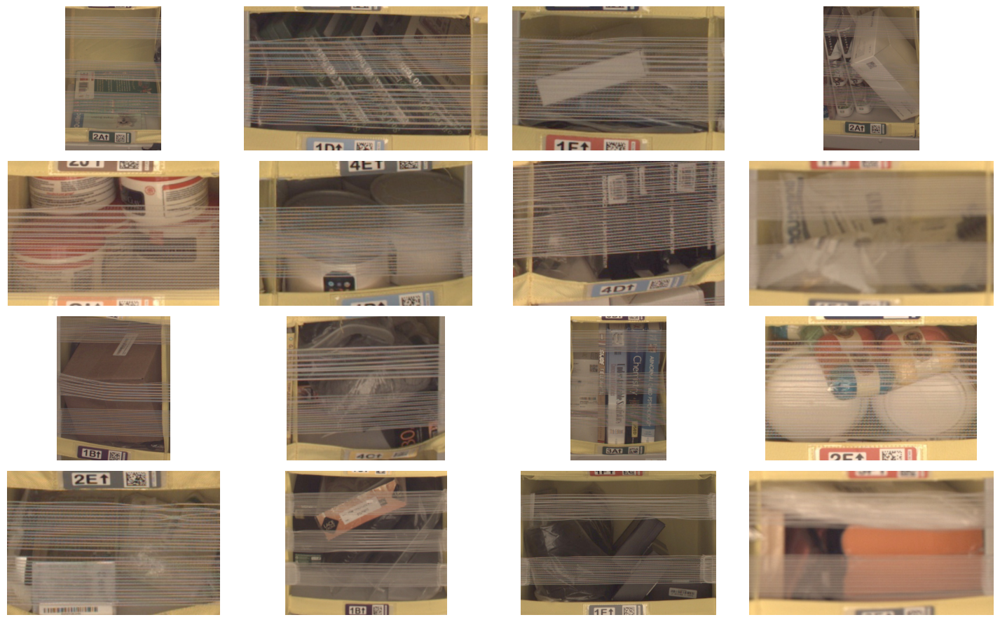

In [163]:
plot_images(glob.glob('data/train/5/*.jpg'))

## Insights:


In [192]:
# size (height,width)
from PIL import Image, ImageOps

def analyze_image_size(path):

    class_list=[]
    height=[]
    width=[]
    channel=[]
    for img in path:


        class_list.append(np.array(Image.open(img)))
    for i in class_list:
        
        h,w,c=i.shape
        height.append(h)
        width.append(w)
        channel.append(c)
        plt.scatter(
        height,width,color='blue', alpha=0.5);
        

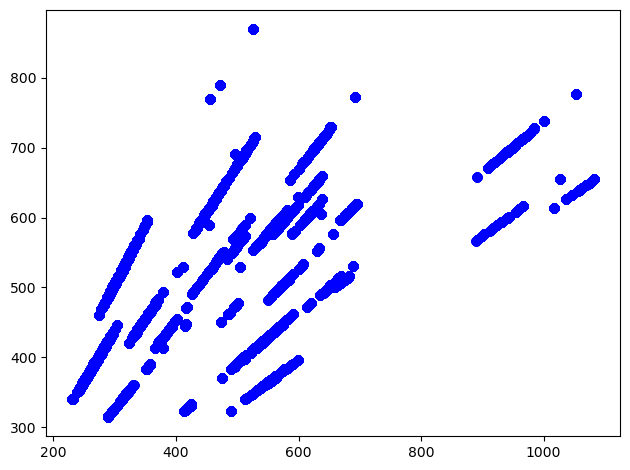

In [193]:
analyze_image_size(glob.glob("data/train/1/*.jpg"))

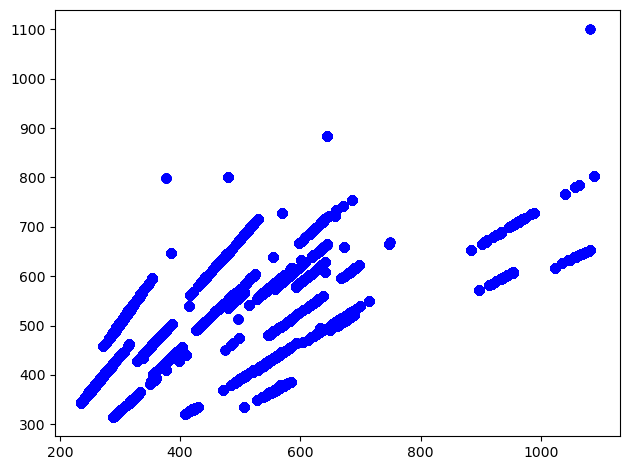

In [194]:
analyze_image_size(glob.glob("data/train/2/*.jpg"))

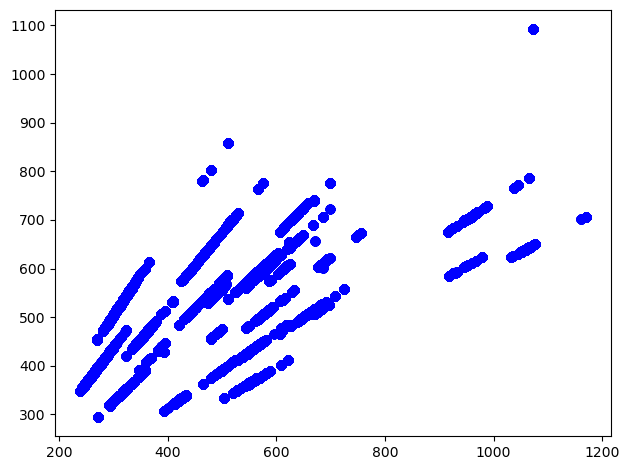

In [195]:
analyze_image_size(glob.glob("data/train/3/*.jpg"))

In [ ]:
#TODO: Perform any data cleaning or data preprocessing

In [ ]:
#TODO: Upload the data to AWS S3

<a id='training'></a>
## Model Training
**TODO:** This is the part where you can train a model. The type or architecture of the model you use is not important. 

**Note:** You will need to use the `train.py` script to train your model.

In [2]:
!pip install smdebug torch torchvision tqdm

Looking in indexes: https://pypi.org/simple, https://pip.repos.neuron.amazonaws.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.1/270.1 kB 4.6 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 710.7 kB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 41.8 MB/s eta 0:00:00:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.3/83.3 kB 18.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 34.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 21.6 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 110.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.1/557.1 MB 2.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.1/317.1 MB 1.8 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 4.0 MB/s eta 0:00:0000

In [2]:
import sagemaker
import boto3
from sagemaker.tuner import CategoricalParameter, ContinuousParameter, HyperparameterTuner
from sagemaker.pytorch import PyTorch
from sagemaker import get_execution_role
from sagemaker.debugger import Rule, DebuggerHookConfig, TensorBoardOutputConfig, CollectionConfig, ProfilerRule, rule_configs
from sagemaker.debugger import ProfilerConfig, FrameworkProfile
import os

In [15]:
role = sagemaker.get_execution_role()

<a id='tuning'></a>
### Hyperparameter Tuning
**TODO:** Here you can perform hyperparameter tuning to increase the performance of your model. You are encouraged to 
- tune as many hyperparameters as you can to get the best performance from your model
- explain why you chose to tune those particular hyperparameters and the ranges.


In [ ]:
#TODO: Declare your model training hyperparameter.
#NOTE: You do not need to do hyperparameter tuning. You can use fixed hyperparameter values

In [18]:
hyperparameter_ranges = {
    "learning_rate": ContinuousParameter(0.001, 0.1),
    "batch_size": CategoricalParameter([32, 64, 128]),
}

role = sagemaker.get_execution_role()

objective_metric_name = "Valid Loss"
objective_type = "Minimize"
metric_definitions = [{"Name": "Valid Loss", "Regex": "Final Validation Loss: ([0-9\\.]+)"}]

In [19]:
estimator = PyTorch(
    entry_point="train.py",
    base_job_name='amazon-bins-hpo',
    role=role,
    framework_version="1.4.0",
    instance_count=1,
    instance_type="ml.m5.2xlarge",
    py_version='py3'
)

tuner = HyperparameterTuner(
    estimator,
    objective_metric_name,
    hyperparameter_ranges,
    metric_definitions,
    max_jobs=4,
    max_parallel_jobs=2,
    objective_type=objective_type
)

In [20]:
os.environ['SM_CHANNEL_TRAINING']='s3://capstone-project-amazon-bin-images/data/'
os.environ['SM_MODEL_DIR']='s3://capstone-project-amazon-bin-images/model/'
os.environ['SM_OUTPUT_DATA_DIR']='s3://capstone-project-amazon-bin-images/output/'
tuner.fit({"training": "s3://capstone-project-amazon-bin-images/data/"}, wait=False)

INFO:sagemaker.image_uris:image_uri is not presented, retrieving image_uri based on instance_type, framework etc.
INFO:sagemaker.image_uris:image_uri is not presented, retrieving image_uri based on instance_type, framework etc.


Using provided s3_resource


INFO:sagemaker:Creating hyperparameter tuning job with name: pytorch-training-230630-0747


In [5]:
from sagemaker.analytics import HyperparameterTuningJobAnalytics

exp = HyperparameterTuningJobAnalytics(
  hyperparameter_tuning_job_name='pytorch-training-230630-0747')

jobs = exp.dataframe()

jobs.sort_values('FinalObjectiveValue', ascending=0)

,batch_size,learning_rate,TrainingJobName,TrainingJobStatus,FinalObjectiveValue,TrainingStartTime,TrainingEndTime,TrainingElapsedTimeSeconds
2,"""128""",0.032647,pytorch-training-230630-0747-002-e8bdb36c,Completed,197.0,2023-06-30 07:49:03+00:00,2023-06-30 09:00:30+00:00,4287.0
0,"""128""",0.005163,pytorch-training-230630-0747-004-d5005802,Completed,174.0,2023-06-30 09:01:04+00:00,2023-06-30 10:10:42+00:00,4178.0
3,"""32""",0.042857,pytorch-training-230630-0747-001-7a9d2d4f,Completed,51.0,2023-06-30 07:49:03+00:00,2023-06-30 08:55:50+00:00,4007.0
1,"""32""",0.005811,pytorch-training-230630-0747-003-a412d263,Completed,44.0,2023-06-30 08:58:58+00:00,2023-06-30 10:04:19+00:00,3921.0


In [11]:
best_hyperparameters={"batch_size":32,"learning_rate":str(round(0.005811,3))}

In [12]:
best_hyperparameters

{'batch_size': 32, 'learning_rate': '0.006'}

<a id='best hyperparameters'></a>
## Train the model with best hyperparameters

In [16]:
estimator = PyTorch(
    entry_point='train.py',
    base_job_name='amazon-bins',
    role=role,
    instance_count=1,
    instance_type="ml.m5.2xlarge",
    framework_version='1.4.0',
    py_version='py3',
    hyperparameters=best_hyperparameters,
)

In [17]:
os.environ['SM_CHANNEL_TRAINING']='s3://capstone-project-amazon-bin-images/data/'
os.environ['SM_MODEL_DIR']='s3://capstone-project-amazon-bin-images/model/'
os.environ['SM_OUTPUT_DATA_DIR']='s3://capstone-project-amazon-bin-images/output/'
estimator.fit({"training": "s3://capstone-project-amazon-bin-images/data/"}, wait=False)

Using provided s3_resource


INFO:sagemaker.image_uris:image_uri is not presented, retrieving image_uri based on instance_type, framework etc.
INFO:sagemaker:Creating training-job with name: amazon-bins-2023-06-30-16-06-35-685


In [ ]:
#TODO: Create your training estimator

In [ ]:
# TODO: Fit your estimator

In [ ]:
#TODO: Create your hyperparameter search space

In [ ]:
#TODO: Create your training estimator

In [ ]:
# TODO: Fit your estimator

In [ ]:
# TODO: Find the best hyperparameters

<a id='deploying'></a>
### Model Deploying and Querying
**TODO:** Can you deploy your model to an endpoint and then query that endpoint to get a result?

In [ ]:
# TODO: Deploy your model to an endpoint

In [ ]:
# TODO: Run an prediction on the endpoint

In [ ]:
# TODO: Remember to shutdown/delete your endpoint once your work is done

In [3]:
model_data_path="s3://sagemaker-us-east-1-372206764755/amazon-bins-2023-06-30-16-06-35-685/output/model.tar.gz"
print(f"Model Data: {model_data_path}")

Model Data: s3://sagemaker-us-east-1-372206764755/amazon-bins-2023-06-30-16-06-35-685/output/model.tar.gz


In [5]:
import sagemaker
from sagemaker.predictor import Predictor

In [6]:
role=sagemaker.get_execution_role()


In [7]:
jpeg_serializer = sagemaker.serializers.IdentitySerializer("image/jpeg")
json_deserializer = sagemaker.deserializers.JSONDeserializer()


class ImagePredictor(Predictor):
    def __init__(self, endpoint_name, sagemaker_session):
        super(ImagePredictor, self).__init__(
            endpoint_name,
            sagemaker_session=sagemaker_session,
            serializer=jpeg_serializer,
            deserializer=json_deserializer,
        )

In [8]:
from sagemaker.pytorch import PyTorchModel
pytorch_model = PyTorchModel(model_data=model_data_path, role=role, entry_point='inference.py', py_version='py36',
                             framework_version='1.6',
                             predictor_cls=ImagePredictor)
predictor = pytorch_model.deploy(initial_instance_count=1, instance_type='ml.m5.xlarge')

-----!

In [14]:
# test model
image_path = "data/test/1/106135.jpg"
with open (image_path , 'rb') as f :
    image = f.read()
response=predictor.predict(image, initial_args={"ContentType": "image/jpeg"})
response

[[-0.0841594934463501,
  0.2603028416633606,
  -0.06588548421859741,
  -0.015903472900390625,
  -0.30723780393600464]]

In [16]:
import numpy as np
np.argmax(response)+1

2

In [19]:
image_path.split("/")[2]

'1'

<a id='inferenc'></a>
# Inference for each class

In [17]:
from PIL import Image
import io
import matplotlib.pyplot as plt

In [30]:
import random
def predict_class(path):
    plt.figure(1, figsize=(15, 9))
    plt.rc('figure', autolayout=True)
    plt.rc('axes', labelweight='bold', labelsize='large',
          titleweight='bold', titlesize=18, titlepad=10)
    plt.rc('image', cmap='magma')
    n = 0
    for i in range(16):
        n += 1
        random_img = random.choice(path)
        with open (random_img , 'rb') as f :
            image = f.read()
            response=predictor.predict(image, initial_args={"ContentType": "image/jpeg"})
            response=np.argmax(response)+1
        plt.subplot(4, 4, n)
        plt.axis('off')
        actual_class=random_img.split("/")[2]
        random_img=Image.open(random_img)
        plt.imshow(random_img,cmap='gray');
        plt.axis('off')
        plt.title(f"Actual Class: {actual_class}, Predicted Class: {response}")
        plt.show();

## Class 1

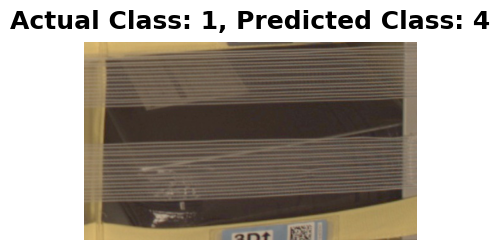

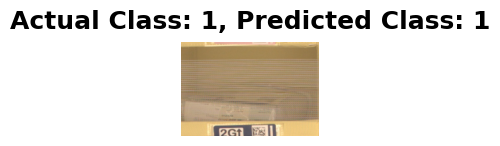

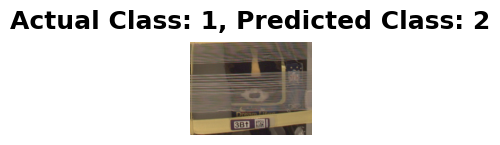

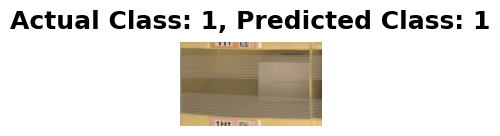

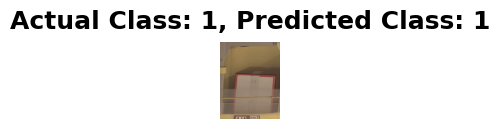

...

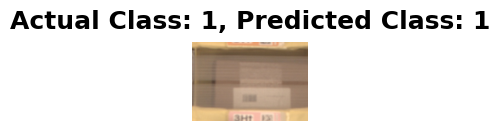

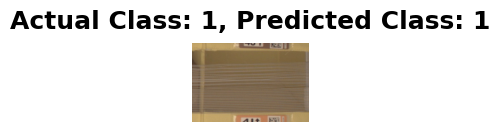

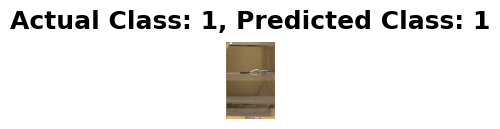

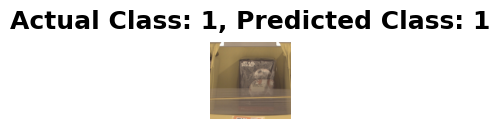

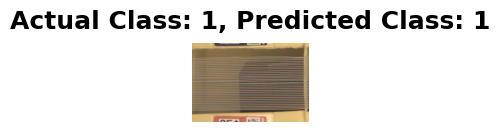

In [31]:
import glob
predict_class(glob.glob("data/test/1/*.jpg"))

## Class 2

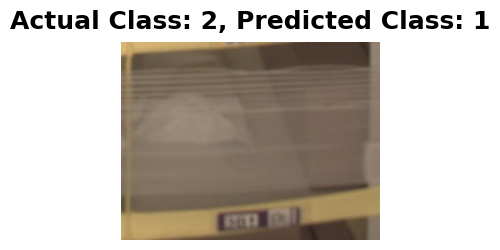

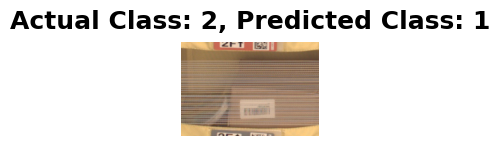

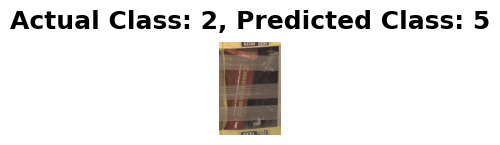

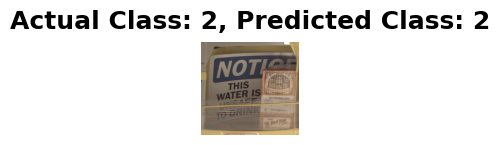

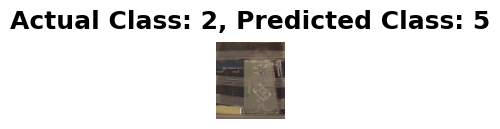

...

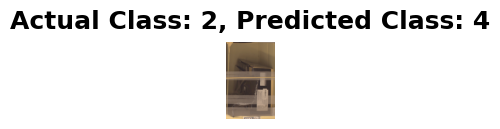

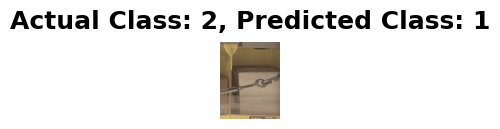

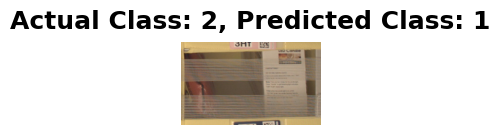

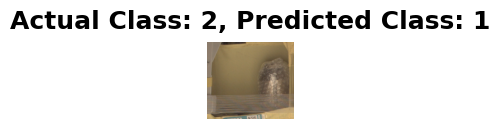

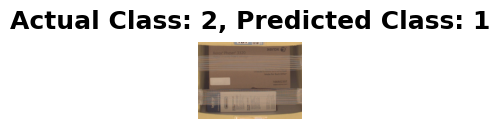

In [32]:
# Class 2
predict_class(glob.glob("data/test/2/*.jpg"))

## Class 3

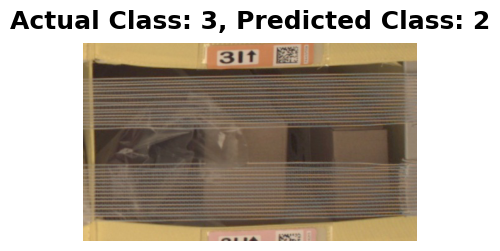

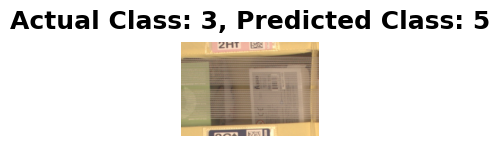

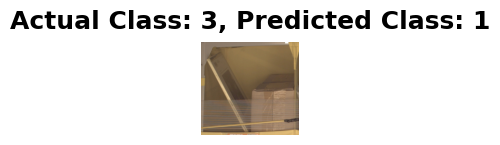

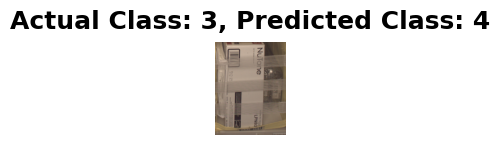

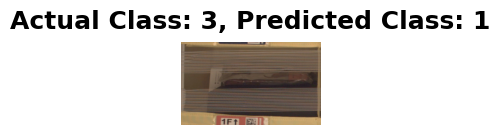

...

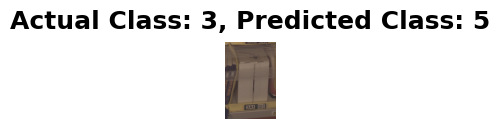

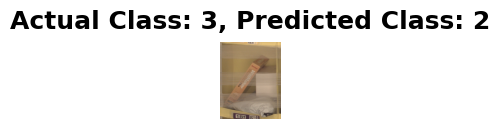

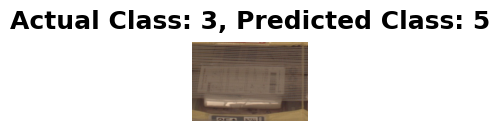

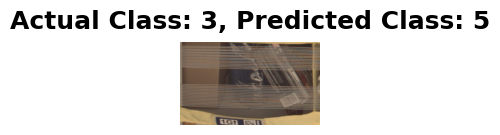

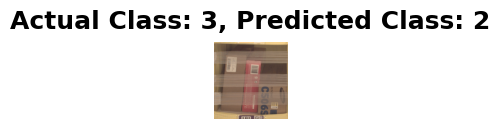

In [33]:
predict_class(glob.glob("data/test/3/*.jpg"))

## class 4

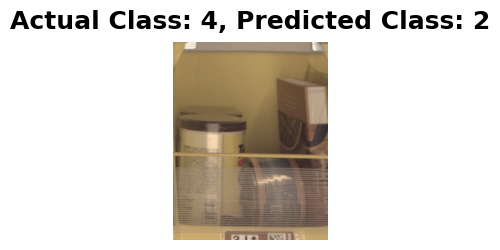

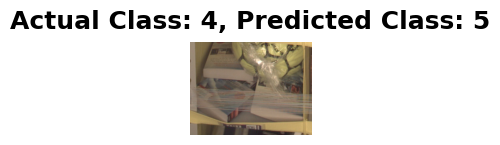

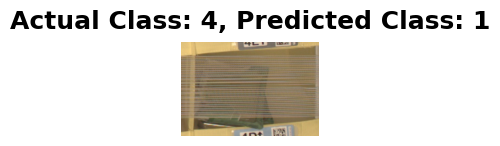

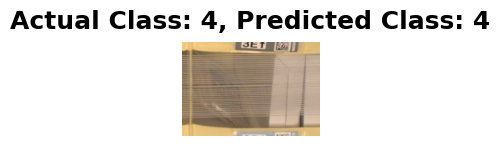

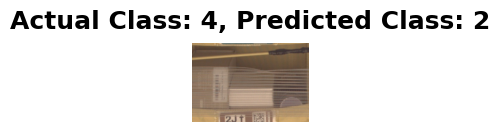

...

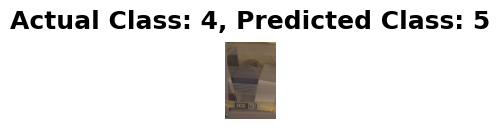

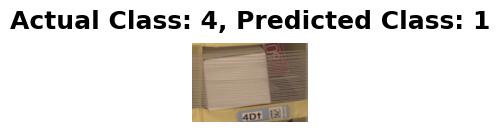

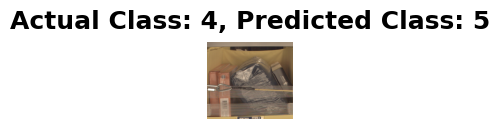

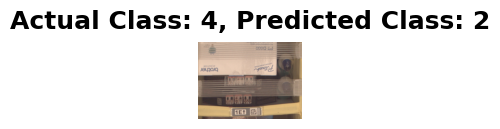

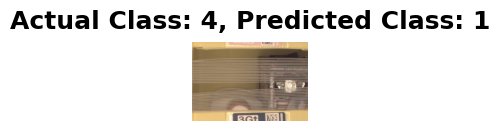

In [34]:
predict_class(glob.glob("data/test/4/*.jpg"))

## Class 5

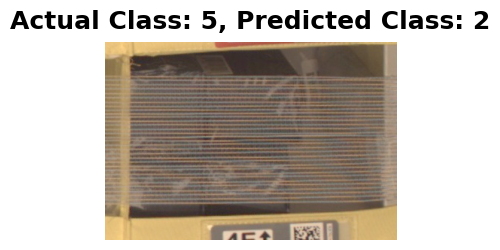

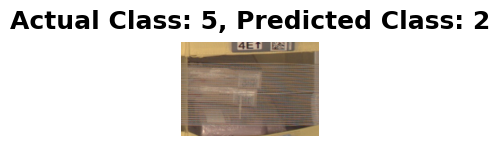

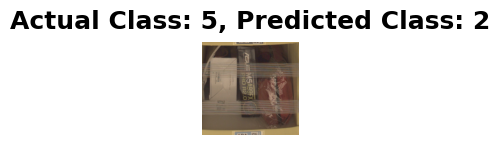

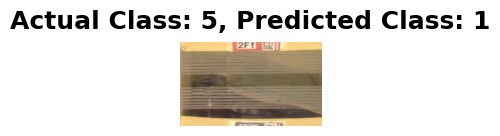

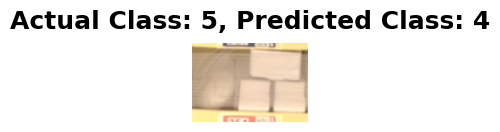

...

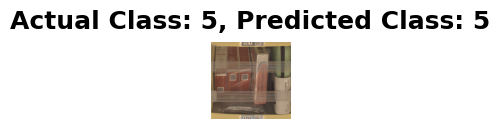

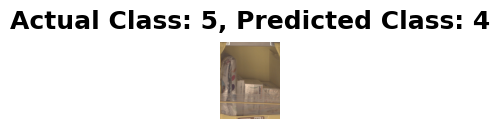

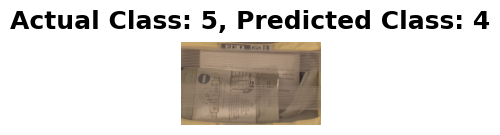

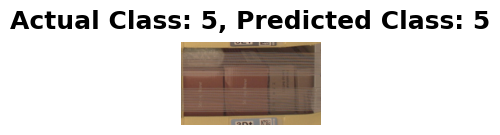

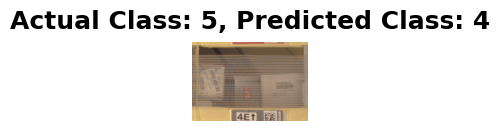

In [35]:
predict_class(glob.glob("data/test/5/*.jpg"))